Must have matplotlib==3.1.3, otherwise Python won't show the last plot (it'll give an error caused by Matplotlib's latest release)

### Import Libraries and Configuration Parameters

In [1]:
import exoplanet as xo
from astropy.timeseries import LombScargle
from scipy import interpolate, signal, fft
from scipy.interpolate import interp1d

import numpy as np
#import seaborn as sns
import pandas as pd
import os, sys

import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.ticker import ScalarFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
import lightkurve as lk
from astropy.units import cds

%matplotlib inline

In [2]:
from pylab import rcParams

rcParams.update({
    "figure.dpi": 200,
    "savefig.dpi": 300,
    "axes.linewidth": 2,
    "lines.linewidth": 2, 
    "figure.figsize": (16,6), 
    "text.usetex": False, 
    "axes.titlesize": 30,
    "axes.labelsize": 25, ## fontsize of the x any y labels
    "xtick.labelsize": 20,
    "ytick.labelsize": 20
})

In [3]:
kepler_tref = 2454833
lit_period = 2.18909730
KIC = 4544587
lit_period = 2.189097
lit_t0 = 121.14 

In [4]:
segment = "0_43978"
lc = pd.read_csv("KIC%s/%s/tfreq_analysis/lc.txt" %(KIC, segment), sep=" ", header=1, names=["Time", "Flux"])
x, y = lc["Time"], lc["Flux"]

In [5]:
#dir_fig = 'KIC%s/%s/wavelet/'%(KIC, segment)
#dir_fig

In [6]:
def read_txt(path_file, sep = " ", header = None, names = None):
    df =  pd.read_csv(path_file, sep=" ", header = header, names = names)
    return df

### Read the Data 

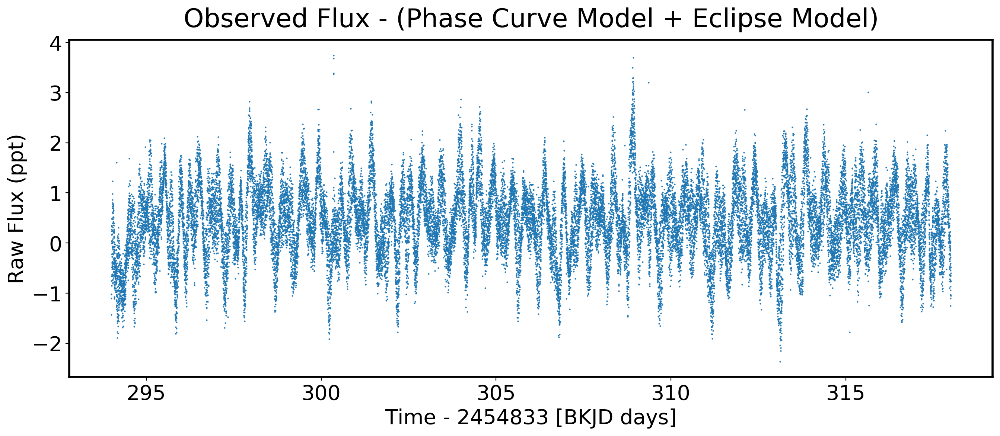

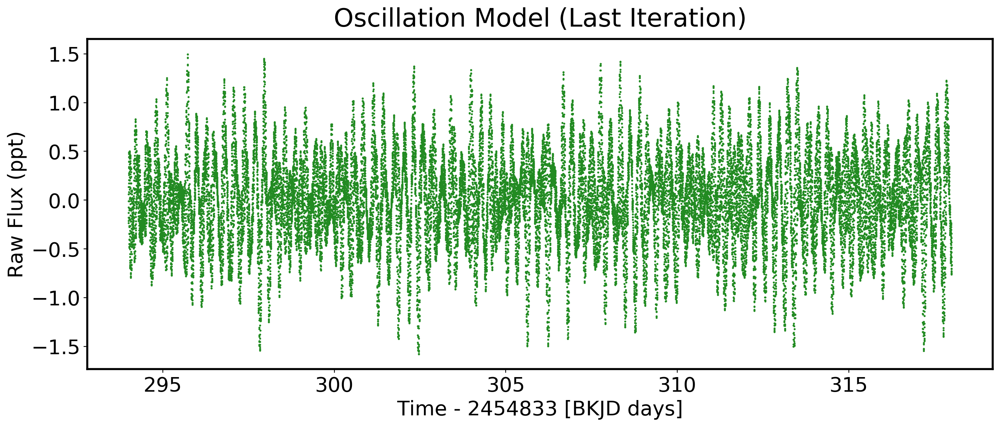

In [7]:
osc_data = read_txt("KIC%s/%s/tfreq_analysis/osc_results.txt" %(KIC, segment), header = 0);
osc_model = read_txt("KIC%s/%s/tfreq_analysis/osc_model_last_iteration.txt" %(KIC, segment), header = 1, names=["Time", "Flux"]);
spectrogram_lc = read_txt("KIC%s/%s/tfreq_analysis/osc_and_noise.txt" %(KIC, segment), header=1, names=["Time", "Flux"])
time, flux = spectrogram_lc["Time"].values, spectrogram_lc["Flux"].values
time_osc, flux_osc = osc_model["Time"].values, osc_model["Flux"].values

fig, ax = plt.subplots(1,1, figsize=(16,6))
ax.scatter(time, flux, marker=".", s=1)
ax.set_title("Observed Flux - (Phase Curve Model + Eclipse Model)", y=1.02, fontsize=25)
ax.set_xlabel("Time - %i [BKJD days]"%kepler_tref, fontsize=20)
ax.set_ylabel("Raw Flux (ppt)", fontsize=20);

fig, ax = plt.subplots(1,1, figsize=(16,6))
ax.scatter(time_osc, flux_osc, c="forestgreen",s=1)
ax.set_title("Oscillation Model (Last Iteration)", y=1.02, fontsize=25)
ax.set_xlabel("Time - %i [BKJD days]"%kepler_tref, fontsize=20)
ax.set_ylabel("Raw Flux (ppt)", fontsize=20);

### Check if the Data is Evenly Sampled

In [48]:
def uneven_to_evenly_sampled_data(t, f, threshold):
    t = np.sort(t)
    dt_points = (t[1:] - t[:-1])
    outliers, outliers_idx = dt_points[dt_points > threshold], np.where(dt_points > threshold)[0]
    dt_median = np.median(dt_points)
    npoints_nodata = outliers/dt_median

    # Let's plot the outliers
    fig, ax = plt.subplots(1,1, figsize=(16,6))
    ax.scatter(t[:-1], dt_points, marker="o", s=1, c="lightgrey")
    ax.scatter(t[:-1][outliers_idx], outliers, marker="o", c="crimson", s=20, label="Outliers")
    ax.legend(fontsize=18)
    ax.set_title("Time between Observations")
    ax.set_xlabel("Time - %i [BKJD days]"%kepler_tref, fontsize=20)
    ax.set_ylabel("$\Delta t$ [d]", fontsize=20);
    
    #Let's fill the gaps
    fake_flux_function = interp1d(t, f)
    new_t = np.array(np.copy(t))
    new_f = np.array(np.copy(f))
    print("Original Length of Time Array = %i" %len(t))

    fig, ax = plt.subplots(1,1)
    ax.scatter(t, f, marker="o", s=2, c="lightsteelblue", label="Original Flux Points")
    for i,idx in enumerate(outliers_idx):
        nfake_points = round(npoints_nodata[i])-1
        t_init = t[idx]
        t_end = t[idx+1]
        x_fake_flux =  np.linspace(t_init, t_end, num = nfake_points+2)[1:-1]
        y_fake_flux = fake_flux_function(x_fake_flux)
        ax.scatter(x_fake_flux, y_fake_flux, marker="o", color="red")
        new_t = np.append(new_t, x_fake_flux)
        new_f = np.append(new_f, y_fake_flux)

    ax.scatter([], [], c="red", label="Fake Flux Points")
    ax.set_xlabel("Time - %i [BKJD days]"%kepler_tref)
    ax.set_ylabel("Raw Flux (ppt)")
    ax.legend(fontsize=18)
        
    print("Final Length of Time Array = %i" %len(new_t))
    print("Added %i points." %(len(new_t)-len(t)))

    
    #Let's plot dt again to confirm that we've added fake flux points correctly.
    sidx = np.argsort(new_t)
    new_t = new_t[sidx]
    new_f = new_f[sidx]
    
    dt_points = (new_t[1:] - new_t[:-1])
    fig, ax = plt.subplots(1,1)
    ax.scatter(new_t[:-1], dt_points, s=15, c="grey")
    ax.set_title("Time between Observations")
    ax.set_xlabel("Time - %i [BKJD days]"%kepler_tref)
    ax.set_ylabel("$\Delta t$ [d]");
    
    print("Range of time gaps = {:>.3e} days ({:>.3e} times median spacing)".format((np.max(dt_points) - np.min(dt_points)), (np.max(dt_points) - np.min(dt_points))/np.median(dt_points)))

    plt.pause(0.01)
    plt.close("all")
    
    return outliers, outliers_idx, new_t, new_f

Original Length of Time Array = 35237
Final Length of Time Array = 35237
Added 0 points.
Range of time gaps = 3.022e-07 days (4.437e-04 times median spacing)


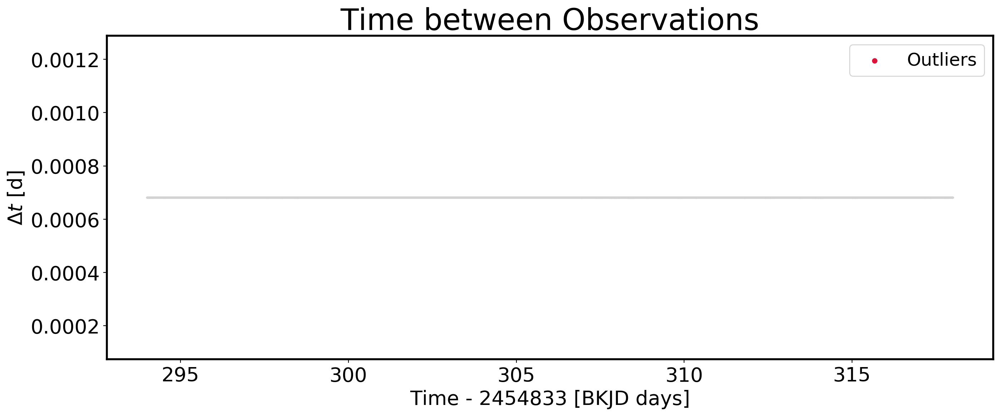

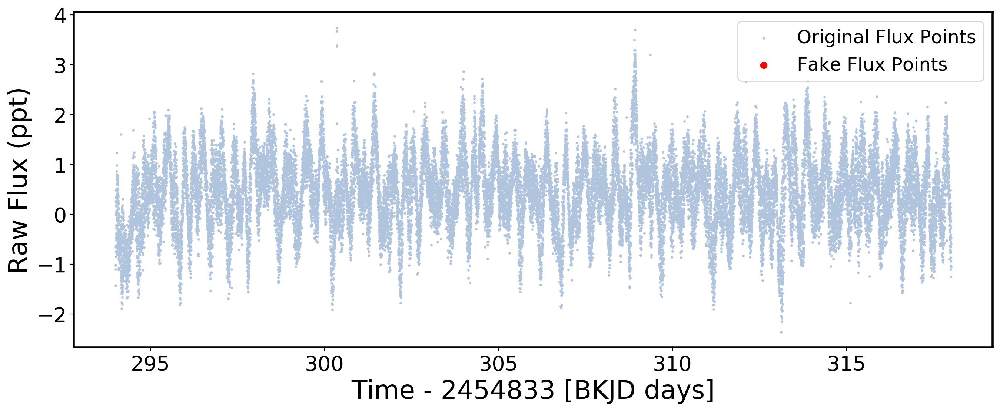

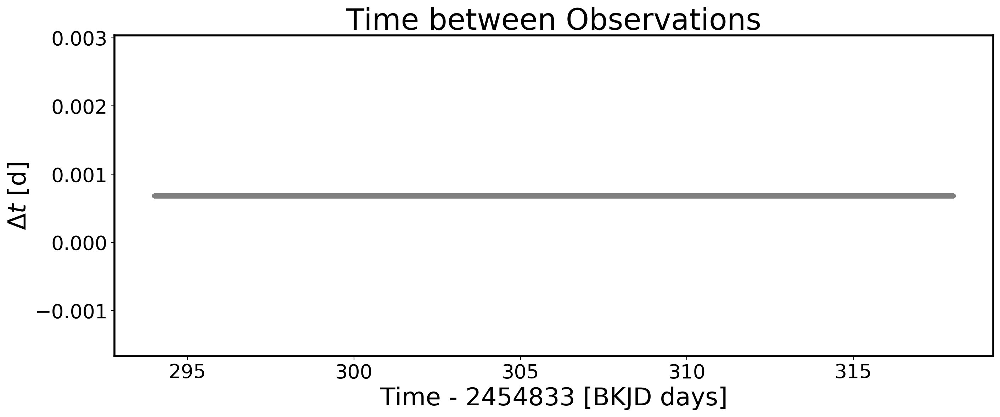

In [49]:
outlier_threshold = 0.001
outliers, outliers_idx, new_time, new_flux = uneven_to_evenly_sampled_data(time, flux, outlier_threshold)

In [10]:
old_time = np.copy(time)
old_flux = np.copy(flux)

time = np.copy(new_time)
flux = np.copy(new_flux)

### Get Signal Properties

In [11]:
def get_signal_properties(signal, print_res = False):
    num_samples = len(flux) #number of samples
    sampling_inteval = np.median(np.diff(time)) #sampling interval (or "rate"). Time span between consecutive samples [d]
    sampling_frequency = 1.0/sampling_inteval # Sampling frequency [1/d] 
    nyquist_frequency = sampling_frequency/2.0
    total_duration = (num_samples - 1) / sampling_frequency #duration of the signal

    if print_res: 
        print("Nº of samples = %i" %num_samples)
        print("Total Duration of Signal = %0.02f [d]" %total_duration)
        print("Sampling Interval = %0.08f [d]" %sampling_inteval)
        print("Sampling frequency = %0.02f [d^-1]" %sampling_frequency)
        print("Nyquist frequency = %0.02f [d^-1]" %nyquist_frequency)

    return num_samples, sampling_inteval, sampling_frequency, nyquist_frequency, total_duration

Nt, dt, fs, fmax, time_span = get_signal_properties(flux, print_res = True)

Nº of samples = 35237
Total Duration of Signal = 24.00 [d]
Sampling Interval = 0.00068107 [d]
Sampling frequency = 1468.28 [d^-1]
Nyquist frequency = 734.14 [d^-1]


### Generate Grid of Frequencies and Run LS Periodogram

We use a LS periodogram because our data is unevenly sampled.

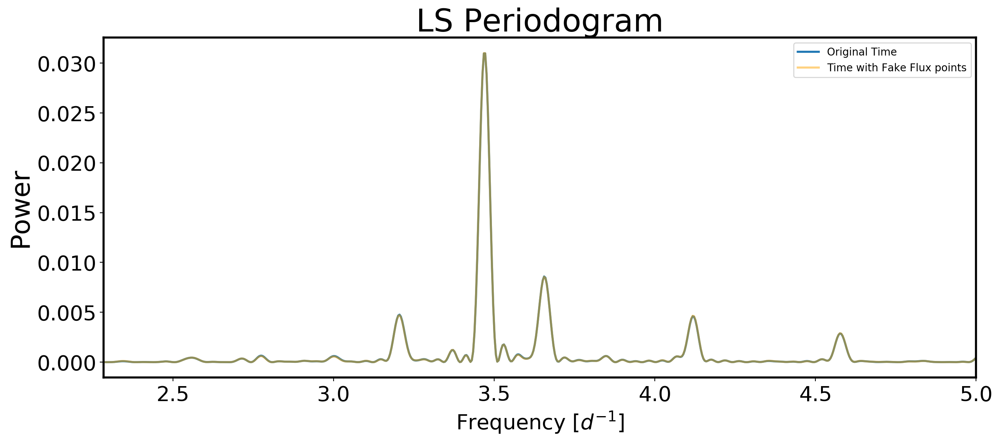

In [12]:
def ls_estimator(t, f, frequencies, filter_period=None, npeaks=15, normalization="psd"):
    #Function based on "exoplanet"'s' LS estimator code but adjusted for a variable frequency grid
    #(https://github.com/exoplanet-dev/exoplanet/blob/main/src/exoplanet/estimators.py)
    
    # Estimate the power spectrum
    periods = 1. / frequencies
    model = LombScargle(t, f)
    powers = model.power(frequencies, method="fast", normalization=normalization)
    powers /= len(t)
    power_est = np.array(powers)
    
    # Identify Peaks
    peaks = xo.find_peaks(frequencies, power_est, max_peaks=npeaks)

    return dict(periodogram=(frequencies, power_est), peaks=peaks, ls=model)
    
orbital_frequency = 1/lit_period
minfr = 5*orbital_frequency #[d^-1] or 1/(total_duration) #5*orbital freq is about 10 hours
maxfr = 200 #[d^-1] #200 d^-1 is about 7 min
N_samples_per_peak = 10 #shouldn't be less than 5. 10 often used as a conservative measure to have good spectral resol'n (p. 36 vanderplas)
df = 1/(time_span*N_samples_per_peak) #p. 36 vanderplas
grid_resolution = (maxfr-minfr)/df+1
freq_grid = np.linspace(minfr, maxfr, int(grid_resolution))

ls_spec = ls_estimator(time, flux, freq_grid, normalization="psd")
ls_spec_old = ls_estimator(old_time, old_flux, freq_grid, normalization="psd")

fig, ax = plt.subplots(1,1, figsize=(15,6))
ax.plot(ls_spec_old["periodogram"][0], ls_spec_old["periodogram"][1], label="Original Time")
ax.plot(ls_spec["periodogram"][0], ls_spec["periodogram"][1], ms=0.5, alpha=0.5, c="orange", label = "Time with Fake Flux points")
ax.set_xlabel(r"Frequency [$d^{-1}$]", size=20)
ax.set_ylabel("Power")
ax.set_title("LS Periodogram")
ax.legend()
ax.set(xlim=(min(freq_grid),5));

If the data were evenly sampled, the LS periodogram with a "PSD" normalization would be equivalent to the Fourier Transform (provided no uncertainties are given). As the cells below show, the results of our LS Periodogram are not quite the same as those from the FFT because the data is not evenly sampled. More information can be found here: https://docs.astropy.org/en/stable/timeseries/lombscargle.html#lomb-scargle-normalization

True
False


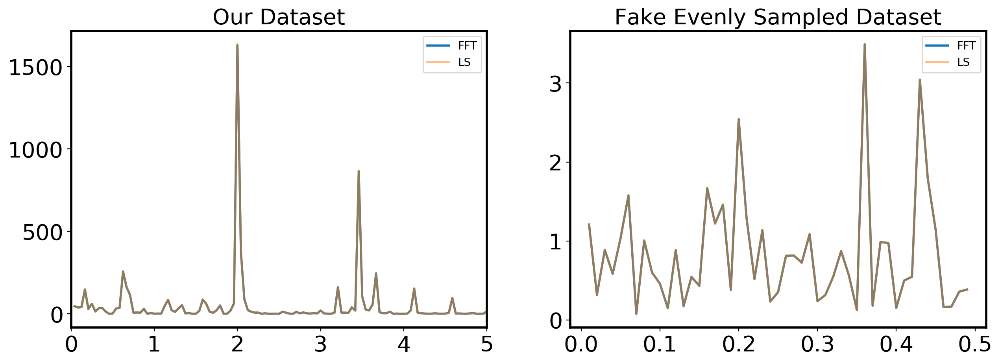

In [13]:
import astropy.units as u
def fourier_periodogram(t, y):
    N = len(t)
    frequency = np.fft.fftfreq(N, t[1] - t[0])
    y_fft = np.fft.fft(y)
    positive = (frequency > 0)
    return frequency[positive], (1. / N) * abs(y_fft[positive]) ** 2

rand = np.random.RandomState(42)
t_days = np.arange(100) 
y_mags = rand.randn(100)

#Evenly Sampled Data
frequency_fourier_even, PSD_fourier_even = fourier_periodogram(t_days, y_mags)
ls_even = LombScargle(t_days, y_mags) 
PSD_LS_even = ls_even.power(frequency_fourier_even, normalization="psd")
print(u.allclose(PSD_fourier_even, PSD_LS_even)) 

#Our dataset -- Not Evenly Sampeld
frequency_fourier, PSD_fourier = fourier_periodogram(time, flux)
ls = LombScargle(time, flux) 
PSD_LS = ls.power(frequency_fourier, normalization="psd")
print(u.allclose(PSD_fourier, PSD_LS)) 

fig, ax = plt.subplots(1,2, figsize=(15,5))
ax[0].plot(frequency_fourier, PSD_fourier, label = "FFT")
ax[0].plot(frequency_fourier, PSD_LS, alpha = 0.5, label = "LS")
ax[0].set(xlim=(0,5)) #let's zoom to see what's happening
ax[0].set_title("Our Dataset", fontsize=20)
ax[0].legend() 

ax[1].plot(frequency_fourier_even, PSD_fourier_even, label = "FFT")
ax[1].plot(frequency_fourier_even, PSD_LS_even, alpha = 0.5, label = "LS")
ax[1].set_title("Fake Evenly Sampled Dataset", fontsize=20)
ax[1].legend() 

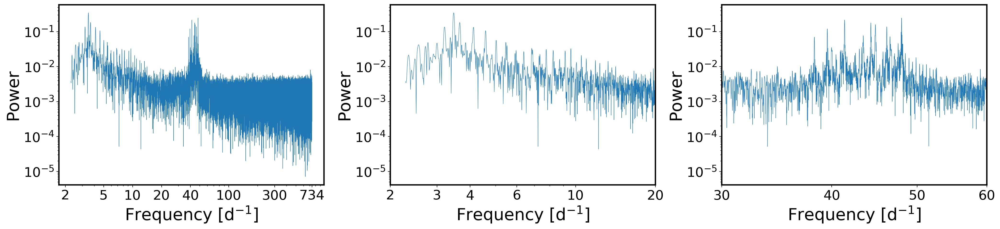

In [14]:
lc = lk.LightCurve(time = time, flux = flux)
pg = lc.to_periodogram(frequency = np.arange(min(freq_grid), fmax, 10E-3), 
                       method='lombscargle', 
                       normalization='amplitude')

fig,ax = plt.subplots(1,3, figsize=(25, 5))
fig.subplots_adjust(wspace=0.25)
pg.plot(scale='log', ax=ax[0]);
ax[0].set_xlabel(r"Frequency [d$^{-1}$]")
ax[0].set_ylabel("Power")
ax[0].set_xticks([2, 5, 10, 20, 40, 100, 300, int(fmax)])
#ax[0].set_xlim([int(min(freq_grid)), int(max(freq_grid))])
ax[0].get_xaxis().set_major_formatter(ScalarFormatter())

pg.plot(scale='log', ax=ax[1]);
ax[1].set_xlabel(r"Frequency [d$^{-1}$]")
ax[1].set_ylabel("Power")
ax[1].set_xticks([2, 3, 4, 6, 10, 20])
ax[1].set_xlim([int(min(freq_grid)), 20])
ax[1].get_xaxis().set_major_formatter(ScalarFormatter())

pg.plot(scale='log', ax=ax[2]);
ax[2].set_xlabel(r"Frequency [d$^{-1}$]")
ax[2].set_ylabel("Power")
ax[2].set_xticks([30, 40, 50, 60])
ax[2].set_xlim([30, 60])
ax[2].get_xaxis().set_major_formatter(ScalarFormatter())

0.0 734.1202591004486
0.0 15.0
30.0 55.0


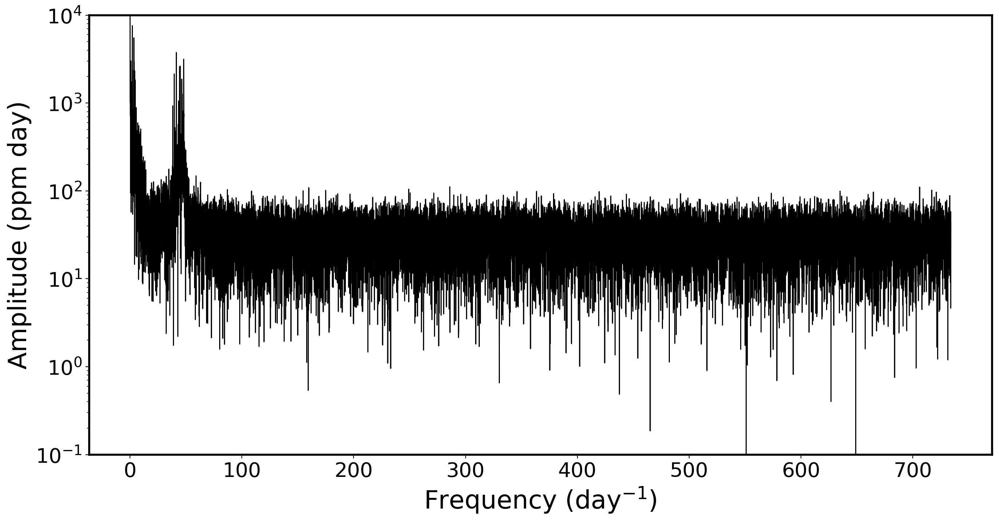

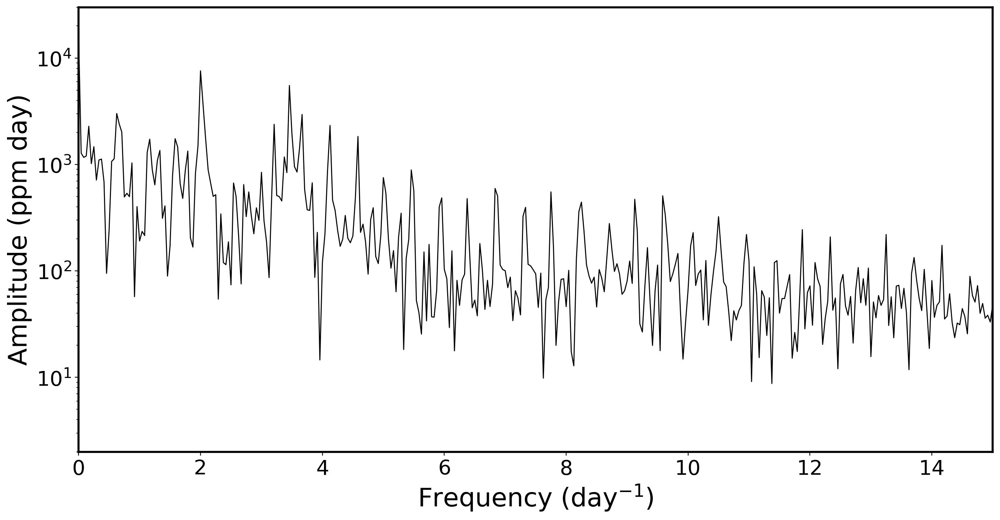

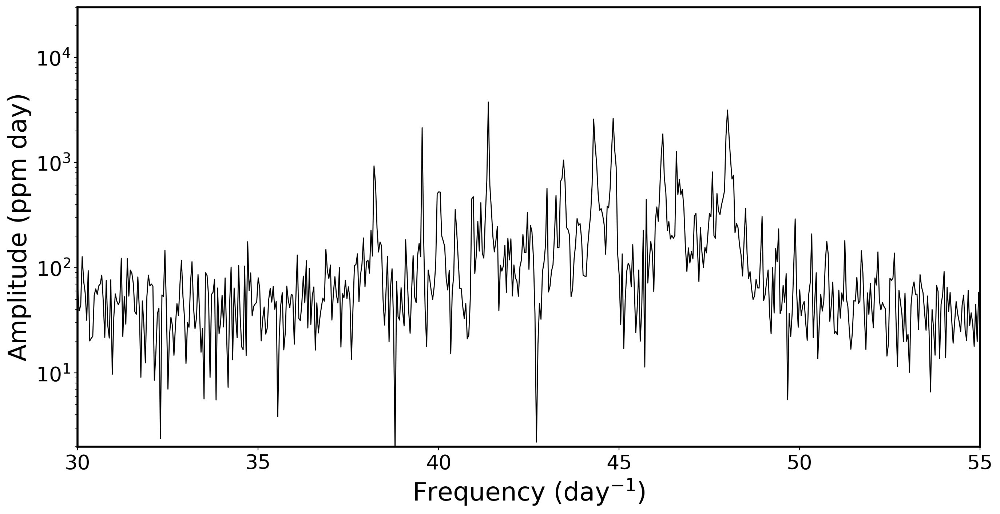

In [15]:
def plot_spectrum(freq, flux_fft, freq_lims = None, amp_lims = None):
    if freq_lims is None: 
        freq_min = 0.0
        freq_max = np.max(freq)
    
    else:
        freq_min, freq_max = freq_lims
        
    print(freq_min, freq_max)
    fig = plt.figure(figsize = (16, 8))
    ax = plt.gca()
    ax.plot(freq, np.abs(flux_fft), linewidth = 1, color = 'black')
    ax.set_xlabel('Frequency (day$^{-1}$)')
    ax.set_ylabel('Amplitude (ppm day)')
    ax.set_yscale('log')
    ax.set_xlim(freq_lims)
    if amp_lims is not None: 
        ax.set_ylim(amp_lims)
    #plt.savefig(dir_fig+"spectrum_%ito%i.png"% (freq_min, freq_max), dpi=300)
    
def plot_raw(time, flux, freq) :
    #Plot raw time series and Fourier transform.
    
    freq_lims, amp_lims, name = (None, [1.0E-1, 1.0E4], 'spectrum_raw_full')        # Whole spectrum.
    plot_spectrum(freq, flux_fft, amp_lims = amp_lims, freq_lims = freq_lims)
    
    freq_lims, amp_lims, name = ([0.0, 15.0], [2.0E0, 3.0E4], 'spectrum_raw_00_15') # First peak.
    plot_spectrum(freq, flux_fft, amp_lims = amp_lims, freq_lims = freq_lims)
    
    freq_lims, amp_lims, name = ([30.0, 55.0], [2.0E0, 3.0E4], 'spectrum_raw_30_55')# Second peak.
    plot_spectrum(freq, flux_fft, amp_lims = amp_lims, freq_lims = freq_lims)
    
    return

def get_fft_and_freq(time, flux):

    # Calculate the discrete Fourier transform and associated frequencies.
    flux_fft = np.fft.rfft(flux)
    freq_fft = np.fft.rfftfreq(Nt, d = dt)

    return freq_fft, flux_fft

freq_fft, flux_fft = get_fft_and_freq(time, flux)
plot_raw(time, flux, freq_fft)

In [40]:
def plot_filtering_freq_domain_magnitude(freq, flux_fft, flux_fft_filtered, filter_, filter_lower_freq, filter_upper_freq):
    #Source: Harry's code
    
    fig, ax_arr = plt.subplots(2, 1, figsize = (14, 10), gridspec_kw = {'height_ratios': [1, 3]}, sharex = True)
    ax = ax_arr[0] 
    
    # Plot the magnitude of the filter.
    ax.plot(freq, np.abs(filter_), c = 'g', label = 'Filter', zorder = 10)
    ax.legend(loc = 'upper right')

    ax.set_ylim([0.0, 1.05])
    ax = ax_arr[1]

    # Plot the flux.
    flux_kwargs = {'alpha' : 0.7, 'linewidth' : 1}
    abs_flux_fft = np.abs(flux_fft)
    i_freq_allowed = np.where(freq > filter_lower_freq)[0]
    max_abs_flux_fft = np.max(abs_flux_fft[i_freq_allowed])
    flux_fft_normalised = flux_fft/max_abs_flux_fft
    #ax.plot(freq, np.abs(flux_fft_normalised), label = 'Flux before filtering', **flux_kwargs) 
    ax.plot(freq, np.abs(flux_fft), label = 'Flux before filtering', **flux_kwargs) 

    # Plot the filtered flux.
    abs_flux_fft_filtered = np.abs(flux_fft_filtered)
    max_abs_flux_fft_filtered = np.max(abs_flux_fft_filtered)
    flux_fft_filtered_normalised = flux_fft_filtered/max_abs_flux_fft_filtered
    #ax.plot(freq, np.abs(flux_fft_filtered_normalised), label = 'Flux after filtering', **flux_kwargs)
    ax.plot(freq, np.abs(flux_fft_filtered), label = 'Flux after filtering', **flux_kwargs)

    ax.set_xlabel('Frequency (cycles per day)')
    ax.set_ylabel('Spectral amplitude (ppm day)')
    ax.set_yscale('log')
    ax.set_xlim([freq[0], freq[-1]])
    
    amp_lims = [1E-3, 2.0E4]
    ax.set_ylim(amp_lims)
    ax.set_xlim([0.0, 15.0])
    ax.legend()

    # Plot the cutoff frequency.
    for ax in ax_arr:
        for freq_ in [filter_lower_freq, filter_upper_freq]:
            ax.axvline(freq_, color = 'k', zorder = 9, alpha = 0.5)

    plt.tight_layout()
    #path_fig = os.path.join(dir_fig, 'filtering_freq.png')
    #print('Saving to {:}'.format(path_fig))
    #plt.savefig(path_fig, dpi = 300)
    return

def plot_filtering_time_domain(time, flux, time_downsampled, flux_filtered_downsampled, raw_only = False, d_t = 1.0):
    time_span = time[-1] - time[0]
    abs_flux = np.abs(flux)
    flux_span = np.max(abs_flux)- np.min(abs_flux) 
    offset = 0.8*flux_span

    n_traces = np.ceil(time_span/d_t)
    n_traces_int = int(n_traces)

    #n_subplots = 3
    n_traces = 3 
    n_traces_float = float(n_traces)
    
    #n_subplots_float = float(n_subplots)
    #fig, ax_list = plt.subplots(n_subplots, 1, figsize = (11.0, 8.5))
    fig = plt.figure(figsize = (14, 10))
    ax = plt.gca()
    flux_kwargs = {'alpha' : 0.7, 'linewidth' : 1}

    #label_flux = 'Raw data'
    label_flux = 'After de-trending'
    label_flux2 = 'After filtering\nand downsampling'
    
    shift = 0
    for i in range(n_traces_int):
        t0 = time[0] + (i*d_t)
        t1 = time[0] + ((i + 1)*d_t)

        j = ((time >= t0) & (time <= t1))
        k = ((time_downsampled >= t0) & (time_downsampled <= t1))

        i_offset = -i*offset

        #flux_mean = np.mean(flux[j])
        if i == 0:
            label_flux = label_flux
            label_flux2 = label_flux2
        else:
            label_flux = None
            label_flux2 = None

        ax.plot(time[j] - t0, flux[j] + i_offset + shift, c = 'dodgerblue', label = label_flux, **flux_kwargs)
        
        if not raw_only:
            ax.plot(time_downsampled[k] - t0, flux_filtered_downsampled[k] + i_offset + shift, c= 'k', label = label_flux2, **flux_kwargs)


    ax.legend(loc = 'lower right', fontsize=20)
    ax.set_xlabel('Time (days)')
    #ax.set_ylabel('Flux (ppm)')
    ax.set_xlim([0.0, d_t])
    ax.set_ylim([-(n_traces_int + 0.5)*offset - 3.5, 2.0])
    
    for axis in ['right', 'left', 'top']:
        ax.spines[axis].set_visible(False)

    ax.set_yticks([])
    plt.tight_layout()
    
    if raw_only:
        name_fig = 'flux_gather_raw'

    else:
        name_fig = 'flux_gather_filtered'
        
    #path_fig = os.path.join(dir_fig, '{:}.png'.format(name_fig))
    #print('Saving to {:}'.format(path_fig))
    #plt.savefig(path_fig, dpi = 300)

    return


def filter_flux(time, flux, freq):
    # Create a fourth-order zero-phase Butterworth filter.
    # A filter with no phase shift is created by applying the filter
    # forward and backwards, which doubles the original order of the filter.
    
    filter_half_order = 2 
    filter_lower_freq =  1.0 # Lower cut-off frequency, cycles per day.
    filter_upper_freq = maxfr #140.0 # Upper cut-off frequency, cycles per day
    
    # Filter cut-off frequencies in radians per day.
    filter_angular_freqs = 2.0*np.pi*np.array([filter_lower_freq, filter_upper_freq])
    
    # Get the filter coefficients.
    filter_numerator, filter_denominator = signal.butter(filter_half_order, filter_angular_freqs, 'bandpass', analog = True)

    # Evaluate the filter at the frequencies of the FFT.
    _, filter_ = signal.freqs(filter_numerator, filter_denominator, worN = 2.0*np.pi*freq)
    
    # Square the filter to get the effect of applying the filter backwards as well.
    filter_ = np.abs(filter_)**2.0

    flux_fft_filtered = filter_*flux_fft # Apply the filter to the FFT.
    
    # Reconstruct the filtered signal with inverse FFT.
    flux_filtered = np.fft.irfft(flux_fft_filtered, len(flux))
    
    # Down-sample the filtered signal.
    # freq_sampling:  Sampling frequency (cycles per day).
    # freq_sampling_downsampled_appx
    #   Approximate sampling frequency after downsampling (samples per day).
    #   This is chosen to be twice the upper frequency of the bandpass filter,
    #   so that the frequency content within the filter limits is adequately
    #   sampled.
    # sampling_interval_downsampled_appx : Approximate sampling interval after downsampling (days).
    # n_samples_downsampled : Number of samples in the time domain after downsampling.
    # sampling_interval_downsampled_appx : Sampling interval after downsampling (days).
    # time_downsampled : Times of the sample points (days) after downsampling.
    # n_samples_downsampled: Number of points (in the time domain) after down-sampling.
   
    freq_sampling_downsampled_appx = 2.0*filter_upper_freq 
    sampling_interval_downsampled_appx = 1.0/freq_sampling_downsampled_appx
    n_samples_downsampled = int(np.round(time_span/sampling_interval_downsampled_appx)) + 1
    time_downsampled = np.linspace(time[0], time[-1], num = n_samples_downsampled)
    sampling_interval_downsampled = time_span/(n_samples_downsampled - 1)
    freq_downsampled = 1.0/sampling_interval_downsampled
    flux_filtered_downsampled = np.interp(time_downsampled, time, flux_filtered)
    
    # Print sampling info.
    print('Original sample frequency:\t{:>10.2f} samples per day'.format(fs))
    print('Final sample frequency:\t\t{:>10.2f} samples per day'.format(freq_downsampled))

    # Save the down-sampled signal.
    fig, ax = plt.subplots(1,1, figsize=(14,6))
    ax.scatter(time, flux, s=5, label="Original Signal")
    ax.scatter(time_downsampled,flux_filtered_downsampled, s=5, label="Downsampled Signal")
    ax.legend(fontsize=20)
    ax.set_xlabel('Time (days)')
    ax.set_ylabel('Raw Flux (ppm)')
    #plt.tight_layout()
    #plt.savefig(dir_fig+"raw_vs_downsampled_signal.png")
    
    #array_out = np.array([time_downsampled, flux_filtered_downsampled])
    #path_out = os.path.join(dir_fig, 'flux_filtered.txt') 
    #print('Saving to {:}'.format(path_out))
    #np.save(path_out, array_out)
    
    # Also create a high--pass-only (i.e de-trending) version of the filter (for plotting only).
    filter_highpass_numerator, filter_highpass_denominator = signal.butter( filter_half_order, filter_angular_freqs[0], 'high', analog = True)
   
    # Evaluate the filter at the frequencies of the FFT.
    _, filter_highpass = signal.freqs(filter_highpass_numerator, filter_highpass_denominator, worN = 2.0*np.pi*freq)
    
    # Square the filter to get the effect of applying the filter backwards # as well.
    filter_highpass = np.abs(filter_highpass)**2.0

    # Apply the filter to the FFT.
    flux_fft_highpassed = filter_highpass*flux_fft

    # Reconstruct the filtered signal
    flux_highpassed = np.fft.irfft(flux_fft_highpassed, len(flux))

    # Plot.
    plot_filtering_time_domain(time, flux_highpassed, time_downsampled, flux_filtered_downsampled, raw_only = False, d_t = 1.0)
    plot_filtering_freq_domain_magnitude(freq, flux_fft, flux_fft_filtered, filter_, filter_lower_freq, filter_upper_freq)

    return time_downsampled, flux_filtered_downsampled, freq_downsampled

Original sample frequency:	   1468.28 samples per day
Final sample frequency:		    399.99 samples per day


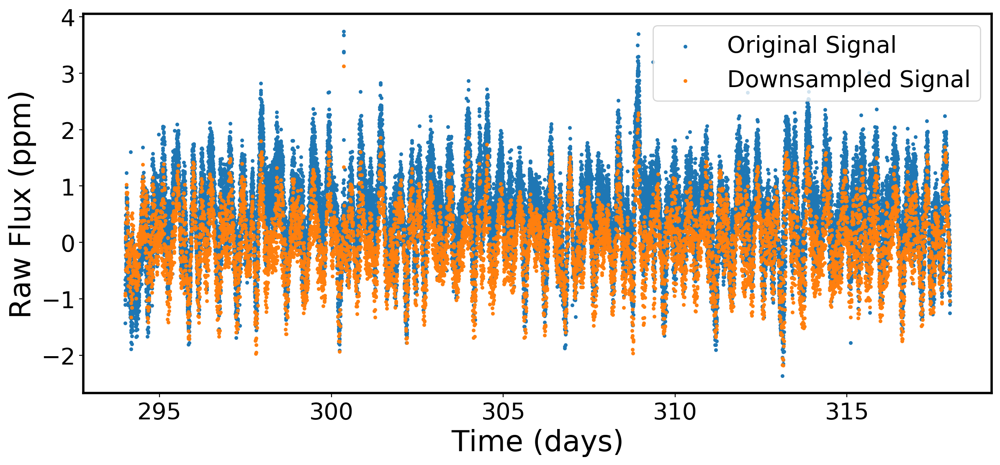

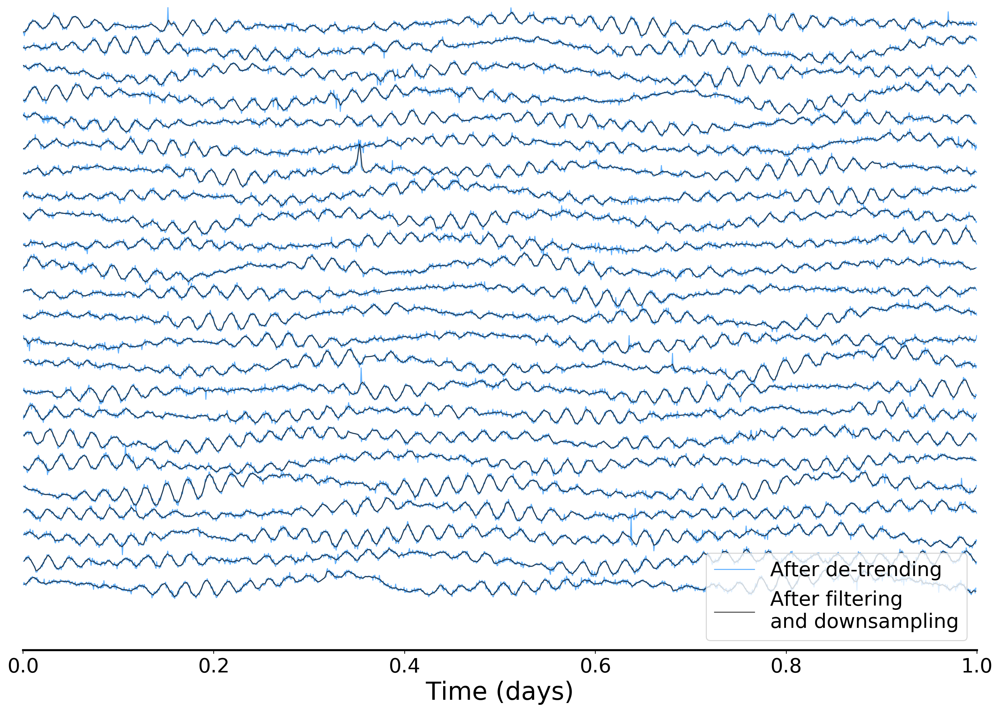

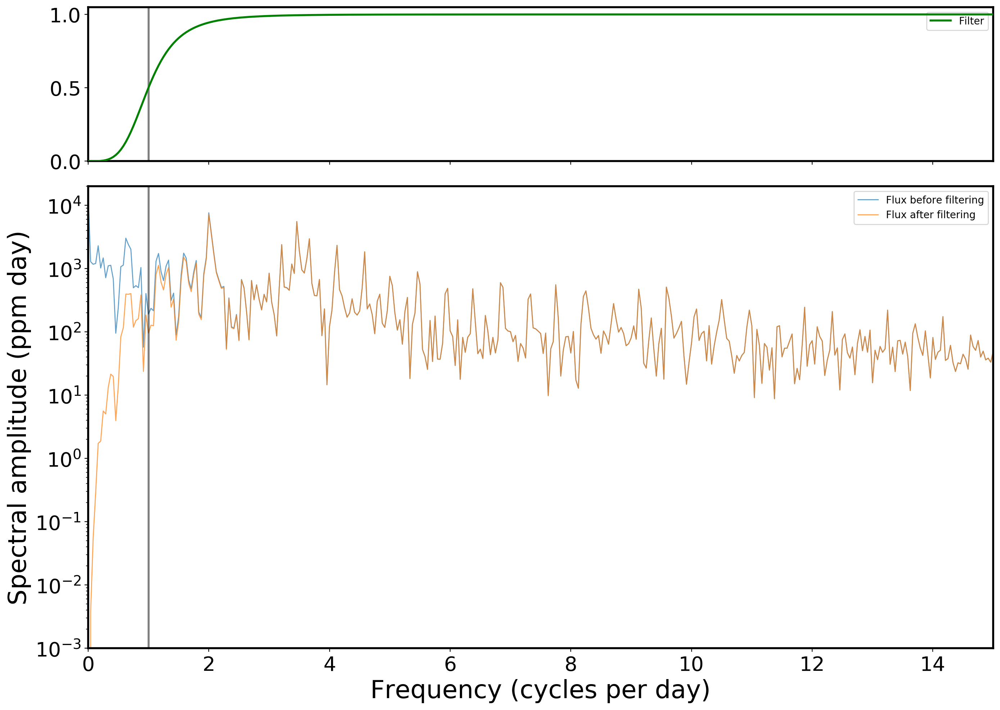

In [41]:
time_downfiltered, flux_downfiltered, freq_sampling_downfiltered = filter_flux(time, flux, freq_fft)

sampling_interval_downfiltered = 1.0/freq_sampling_downfiltered

In [18]:
def calculate_window_function(t, fary):
    LSwindow = LombScargle(t, 1.0, fit_mean = False, center_data=False)
    Pwindow = LSwindow.power(fary)
    return LSwindow, Pwindow

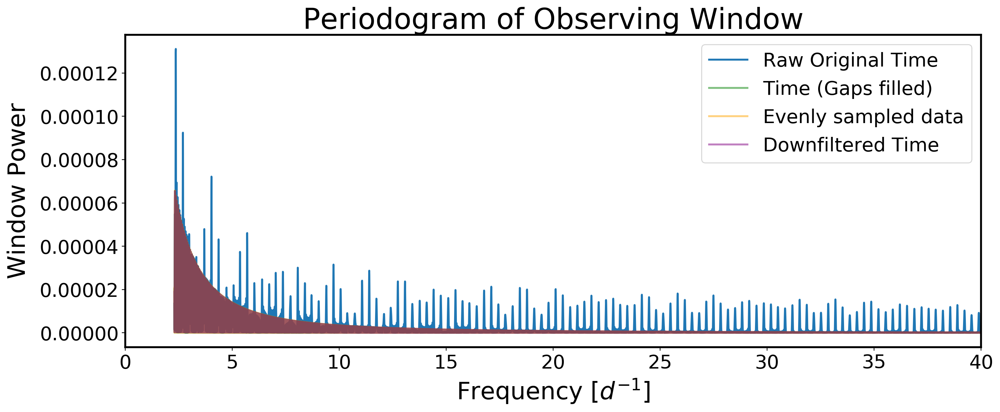

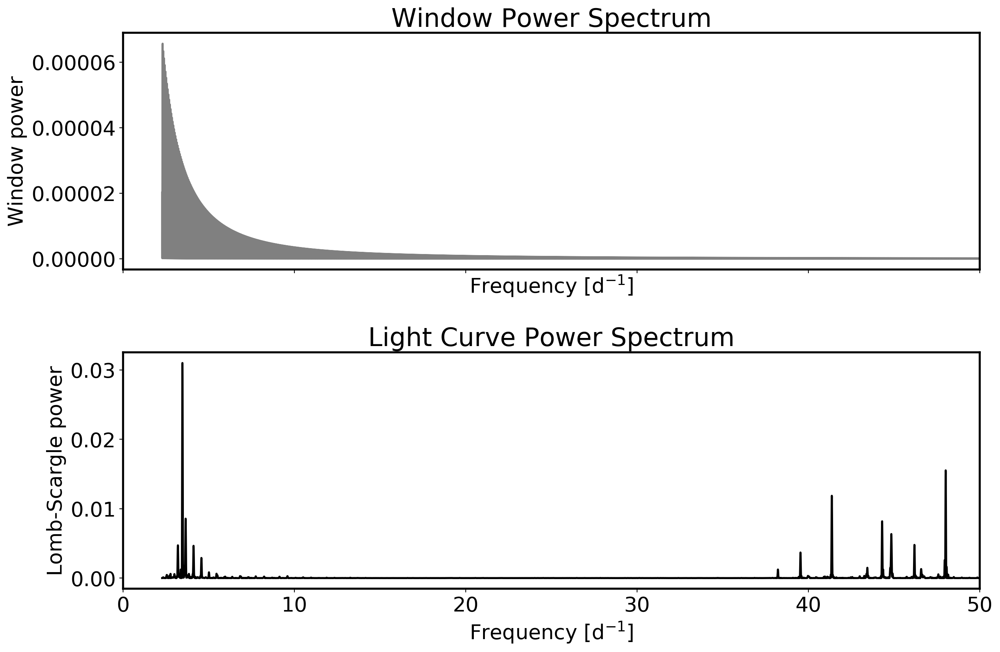

In [19]:
#https://github.com/jakevdp/PracticalLombScargle/blob/master/figures/StructuredWindows.ipynb
   
# WF for old time array
ls_window_old, p_window_old = calculate_window_function(old_time, freq_grid)

# WF for new time array
ls_window, p_window = calculate_window_function(time, freq_grid)

# WF for downfiltered (new) time array
ls_window_downfiltered, p_window_downfiltered = calculate_window_function(time_downfiltered, freq_grid)

# WF for evenly sampled data 
x_dt = np.arange(0, time_span, dt)
ls_window_dt, p_window_dt = calculate_window_function(x_dt, freq_grid)

fig, ax = plt.subplots(1,1, figsize=(16, 6)) 
ax.plot(freq_grid, p_window_old, label = "Raw Original Time")
ax.plot(freq_grid, p_window, c="green", ms=0.3, alpha=0.5, label = "Time (Gaps filled)")
ax.plot(freq_grid, p_window_dt, c="orange", ms=0.2, alpha=0.5, label = "Evenly sampled data")
ax.plot(freq_grid, p_window_downfiltered, c="purple", ms=0.1, alpha=0.5, label = "Downfiltered Time")
ax.set_xlabel(r"Frequency [$d^{-1}$]", size=25, labelpad=5)
ax.set_ylabel("Window Power", size=25, labelpad=10)
ax.legend(loc="upper right", fontsize=20)
ax.set_xlim(0,40)
ax.set_title("Periodogram of Observing Window", fontsize=30);

fig, ax = plt.subplots(2, figsize=(15, 10), sharex=True)
axs = [ax[0], ax[1]]
fig.subplots_adjust(hspace=0.35)
ax[0].plot(freq_grid, p_window, c="grey")
ax[0].set_ylabel('Window power', fontsize=20)
ax[0].set_title('Window Power Spectrum', fontsize=25);

ax[1].plot(ls_spec["periodogram"][0], ls_spec["periodogram"][1], "-k")
ax[1].set_title('Light Curve Power Spectrum', fontsize=25);
ax[1].set_ylabel("Lomb-Scargle power", fontsize=20)
for a in axs:
    a.set_xlim(0,50)
    a.set_xlabel('Frequency [d$^{-1}$]', fontsize=20)

## Create Spectrogram of Unevenly Sampled Data
<a class="anchor" id="section_2_3"></a>

The following is an implementation of a spectrogram that can deal with unevently sampled data. It uses the extended Lomb-Scargle periodogram.

1. Windows: nice article explaining some of the fundamental ones: https://community.sw.siemens.com/s/article/window-types-hanning-flattop-uniform-tukey-and-exponential Note on windows: Windows are used to "stretch" the frequency peaks. With spectrograms, one tries to overlap them so that each measurement is taken into account with the same weight as every other measurement.

2. dt2: (a) Too high time resolution (low Δ𝑡2 ) will result in fuzziness along the frequency direction (b) Too low time resolution (high Δ𝑡2 ) will result in the inability to capture frequencies changing too fast over time (c) trade off time resolution will give a well focused spectrogram with able to detect frequencies that change over tim

In [20]:
def create_spectrogram(time, flux):
    
    #Create Tukey Window 
    alpha = 0.25      # "Shape parameter of the Tukey window, representing the fraction of the window inside the cosine tapered region. If zero, the Tukey window is equivalent to a rectangular window. If one, the Tukey window is equivalent to a Hann window."
    window = ("tukey", alpha)
    Nwindow = 101  # Nº of sample points to interpolate from the window
    N_samples_per_peak = 10 #shouldn't be less than 10
    
    print("* Generating a TUKEY window with...")
    print("     alpha = %0.02f" %alpha)
    print("     Nº of sample points to interpolate from window  = %i" %Nwindow)
    
    # Desired Time Resolution and Overlap
    dt2 = 0.16 
    overlap = alpha/2 #Currently set to 1/8, which is the default spectrogram value in python. 
    print("\n* Generating Spectrogram with...")
    print("     Desired Time Resolution = %0.02f " % dt2)
    print("     Desired Overlap = %0.02f" %overlap)
    
    #Max. Nº of samples per chunk for a given overlap
    Nt_chunk = dt2 / dt / (1 - overlap) # max. nº of samples per segment with an overlap equal to "overlap", if dt2 is to be respected
    Nt_chunk = max(int(2**np.floor(np.log2(Nt_chunk))), 2) # closer power of two below maximum. note: FFTs work best when N is a power of 2.
    print("\n* If Desired Time Resolution and Overlap is to be respected, we have...")
    print("     Nº of samples per window = %i" %Nt_chunk)
    
    #Time resolution of each window.
    effective_dt2 = (Nt_chunk - Nt_chunk//(1/overlap))*dt
    print("     Time resolution per window = %0.03f [d] (desired %0.03f [d])" %(effective_dt2, dt2))
    
    #Duration of each segment
    Tseg = dt * (Nt_chunk - 1) # Duration of one chunk (= duration of one window)
    print("     Duration of one window = %0.03f [d]. This yields an effective frequency resolution of %0.02f [d^-1]" %(Tseg, 1/Tseg))
    
    #Create Spectrogram Time Array
    #The variable `t2` is the center of each window. It goes from where the 1st time measurement is
    #plus T_seg/2 (half a window), to where the last time measurement is minus the region that is overlapped
    print("\n* Creating the Spectrogram TIME Array...")
    t2 = np.arange(time[0]+Tseg/2, time[-1]-Tseg/2, Tseg*(1-overlap))
    t_seg_start = t2 - Tseg/2
    t_seg_end   = t2 + Tseg/2
    
    #Create Spectrogram Frequency Array
    print("* Creating the Spectrogram FREQUENCY Array...")
    df2 = 1/(Tseg*N_samples_per_peak) #p.36 vanderplas
    grid_resolution_spectrogram = (maxfr-minfr)/df2+1
    f2 = np.linspace(minfr, maxfr, int(grid_resolution_spectrogram))
    
    #Prepare window to be applied to the data
    window_data = signal.get_window(window, Nwindow)
    window_t = np.arange(0, Nwindow) * Tseg/(Nwindow - 1)
    get_window_value = interpolate.interp1d(window_t, window_data)
    apply_window = lambda t, x: x*get_window_value(t)
    
    #Generate the Spectrogram
    P = np.zeros((f2.size, t2.size))
    print("* Generating the Spectrogram...")
    for i in range(t2.size):
        t_seg_flag = np.logical_and(time >= t_seg_start[i], time < t_seg_end[i])
        ind_seg = np.flatnonzero(t_seg_flag)

        if ind_seg.size < 2:  # No data in this segment, skip
            P[:,i] = np.nan
            continue

        t_seg = time[ind_seg] - t_seg_start[i]
        y_seg = flux[ind_seg]

        # Detrend
        y_seg = signal.detrend(y_seg, type="linear")

        # Window
        y_seg = apply_window(t_seg, y_seg) #Apply the given window to the given array along the given axis.

        # Lomb Scargle
        ls = LombScargle(t_seg, y_seg, normalization='psd')
        p = ls.power(f2)

        P[:,i] = p
    
    print("--> Done.")
    return P, t2, f2

* Generating a TUKEY window with...
     alpha = 0.25
     Nº of sample points to interpolate from window  = 101

* Generating Spectrogram with...
     Desired Time Resolution = 0.16 
     Desired Overlap = 0.12

* If Desired Time Resolution and Overlap is to be respected, we have...
     Nº of samples per window = 256
     Time resolution per window = 0.153 [d] (desired 0.160 [d])
     Duration of one window = 0.174 [d]. This yields an effective frequency resolution of 5.76 [d^-1]

* Creating the Spectrogram TIME Array...
* Creating the Spectrogram FREQUENCY Array...
* Generating the Spectrogram...
--> Done.


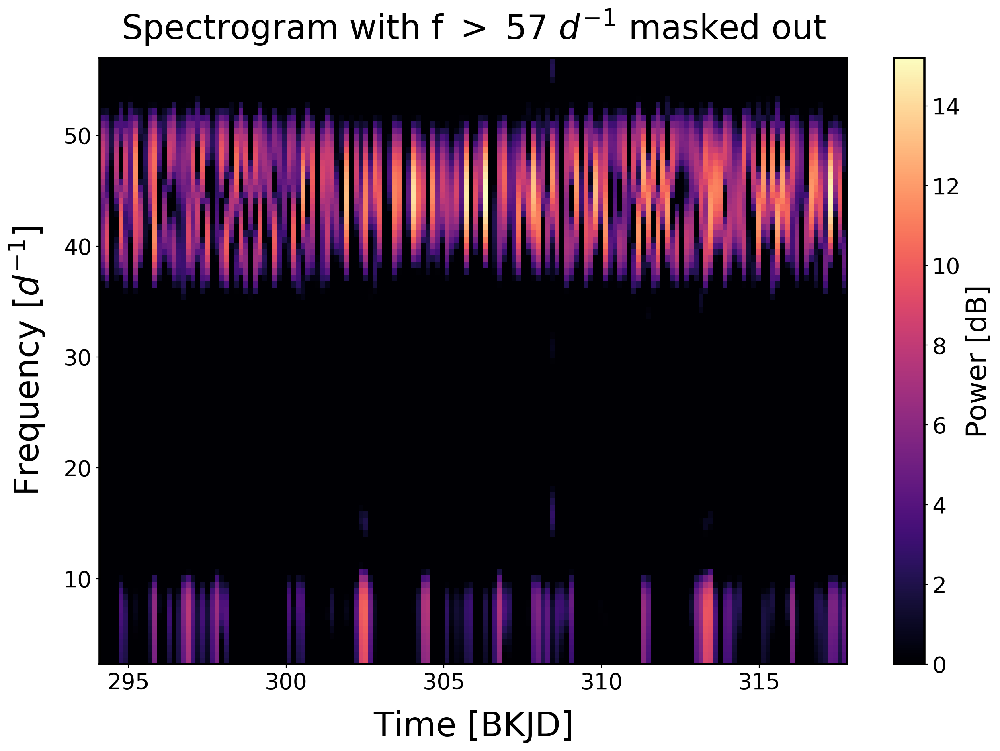

In [21]:
P, t2, f2 = create_spectrogram(time_osc, flux_osc)

f_min = min(freq_grid)
f_max = int(1.2*max(osc_data["freq"]))
f_range = f_max-f_min
pmin = 0.0
color_map ="magma" #"coolwarm" #"magma" #"coolwarm" #"Blues" #"RdYlBu_r" #"RdYlBu_r", "Greysd

fig, ax = plt.subplots(1,1, figsize=(15,10))
s = ax.pcolormesh(t2, f2, 10*np.log10(P), vmin=pmin,  cmap=color_map)# ="RdYlBu_r")
ax.set_ylabel(r'Frequency [$d^{-1}$]', size=30, labelpad=15)
ax.set_xlabel('Time [BKJD]', size=30, labelpad=15)
ax.set_ylim(min(freq_grid),f_max)
fig.colorbar(s, ax=ax, label = "Power [dB]")
ax.set_title(r"Spectrogram with f $>$ %i $d^{-1}$ masked out" %f_max,  y=1.02);

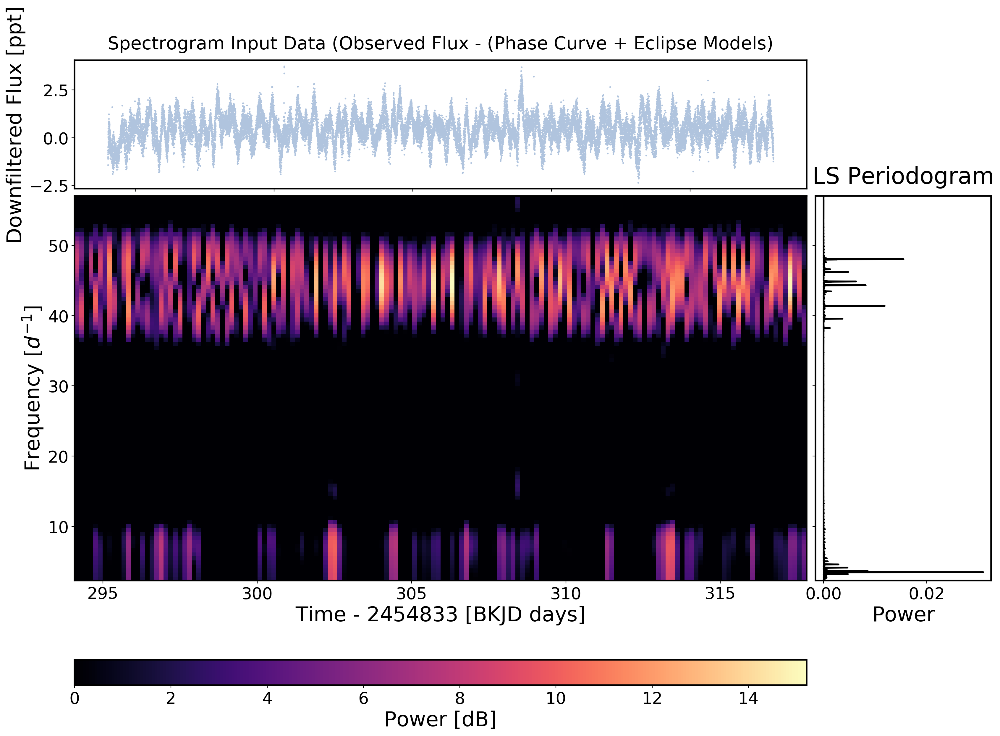

In [22]:
widths = [5, 1.2] # two columns, with widths ratio 6 to 1
heights = [2, 6, 1, .4] # 4 columns

#   height of top plot, central plot, space for xlabels of central plot and colorbar below
fig, _ = plt.subplots(0, 0, figsize=(20,14))
grid = plt.GridSpec(
    4,
    2,
    hspace=0.05,
    wspace=0.02,
    figure=fig,
    width_ratios=widths,
    height_ratios=heights,
)
# Set up main plot: time vs freq and power as color
ax = fig.add_subplot(grid[1:-2, :-1])

# Set up top plot
ax_top = fig.add_subplot(grid[0, :-1])
ax_top.scatter(time, flux, c="lightsteelblue", s=1)  
ax_top.set_ylabel("Downfiltered Flux [ppt]", size=25)
ax_top.set_title("Spectrogram Input Data (Observed Flux - (Phase Curve + Eclipse Models)", size=22, y=1.05);

# Set up right plot: freq as y axis hence sharey. NOTE it's inverted wrt the figure above
ax_right = fig.add_subplot(grid[1:-2, -1], sharey=ax)
ax_right.plot(ls_spec["periodogram"][1], ls_spec["periodogram"][0], c="k") 
ax_right.set_xlabel("Power", size=25)
ax_right.set_ylim(f_min, f_max)
ax_right.set_title("LS Periodogram", size=28, y=1.02);

# Create axes for colorbar below
ax_bottom = fig.add_subplot(grid[-1, :-1])

# Personalize axes
ax_top.tick_params(labelbottom=False)
ax_right.tick_params(labelleft=False)

# main plot
mesh_power = ax.pcolormesh(t2, f2, 10*np.log10(P), vmin=pmin, cmap=color_map)
ax.set_ylabel(r'Frequency [$d^{-1}$]', size=25)
ax.set_xlabel("Time - %i [BKJD days]"%kepler_tref, size=25)
ax.set_ylim(f_min, f_max)
fig.colorbar(mesh_power, cax=ax_bottom, label = "Power [dB]", orientation="horizontal")

# Multi-Resolution Spectrogram 

In [43]:
# We will create spectrograms with various window lengths. 
nsamples_window_min =  64 #* 8 
nsamples_window_max = 256 #* 8
nsamples_window_range = nsamples_window_max - nsamples_window_min

In [44]:
# Define a function which relates the frequency of the signal to the desired window length. 
# Linear decrease from max to min window length in the specified frequency range.
nsamples_func = lambda f: -nsamples_window_range*(f - f_min)/f_range + nsamples_window_max

# Calculate a suite of spectrograms with various window lengths
n_spectrograms = 50
nsamples_list = np.array(
    np.round(np.linspace(nsamples_window_min, nsamples_window_max, num = n_spectrograms)),
    dtype = np.int)

In [25]:
def create_multiresolution_spectrogram(t, f, Nt_chunk, Tseg, n_overlap):
    
    #Create Tukey Window
    alpha = 0.25      
    window = ("tukey", alpha)
    Nwindow = 101  # Nº of sample points to interpolate from the window
    N_samples_per_peak = 10
    
    #Create Spectrogram Time Array
    t2 = np.arange(t[0]+Tseg/2, t[-1]-Tseg/2, Tseg*(1-n_overlap))
    t_seg_start = t2 - Tseg/2
    t_seg_end   = t2 + Tseg/2
    
    #Create Spectrogram Frequency Array
    df2 = 1/(Tseg*N_samples_per_peak)
    grid_resolution_spectrogram = (f_max-f_min)/df2+1
    f2 = np.linspace(minfr, maxfr, int(grid_resolution_spectrogram))
    
    #Prepare window to be applied to the data
    window_data = signal.get_window(window, Nwindow)
    window_t = np.arange(0, Nwindow) * Tseg/(Nwindow - 1)
    get_window_value = interpolate.interp1d(window_t, window_data)
    apply_window = lambda t, x: x*get_window_value(t)
    
    #Generate the Spectrogram
    P = np.zeros((f2.size, t2.size))
    for i in range(t2.size):
        t_seg_flag = np.logical_and(t >= t_seg_start[i], t < t_seg_end[i])
        ind_seg = np.flatnonzero(t_seg_flag)        
        if ind_seg.size < 2:  # No data in this segment, skip
            P[:,i] = np.nan
            continue

        t_seg = t[ind_seg] - t_seg_start[i]
        y_seg = f[ind_seg]

        # Detrend
        y_seg = signal.detrend(y_seg, type="linear")
        
        # Window
        y_seg = apply_window(t_seg, y_seg) #Apply the given window to the given array along the given axis.

        # Lomb Scargle
        ls = LombScargle(t_seg, y_seg, normalization='psd')
        p = ls.power(f2)
        P[:,i] = p

    print("* Storing P, t2, f2...")
        
    return t2, f2, P 

In [45]:
time_spectrograms = []
freq_spectrograms = []
power_spectrograms =  []
    
# Calculate a suite of spectrograms with various window lengths
for i in range(n_spectrograms):
    print("\n**************** Spectrogram %i ****************" %(i+1))
    
    nsamples_per_window = nsamples_list[i]
    n_overlap = nsamples_per_window//8.0        # The windows overlap by 1/8 of their width (roughly corresponding to the tapered portion of each window).
                                                # (larger overlap reduces statistical independence of each coefficient).
    window_length = (nsamples_per_window-1)*dt
     
    print("* Spectrogram Properties: ")
    print("     Nº of samples in window = %i" %nsamples_per_window)
    print("     Overlap = %i (1/8 * window length)" %n_overlap)
    print("     Window length = %0.03f [d]" %window_length)
    print("     Effective frequency resolution per window = %0.02f [d^-1]" %(1/window_length))
    
    # Calculate the spectrogram for this window length.
    #t2, f2, P = create_multiresolution_spectrogram(time, flux, nsamples_per_window, window_length, n_overlap)
    
    f2, t2, P = signal.spectrogram(flux_downfiltered,
                        fs          = fs,
                        nperseg     = nsamples_per_window,
                        noverlap    = n_overlap,
                       detrend     = 'linear')
    #Store the Results
    time_spectrograms.append(t2)
    freq_spectrograms.append(f2)
    power_spectrograms.append(P)
    
# Create a grid of frequency and time. 
# Use the smallest spacing for each variable from the spectrograms.
d_f_min_appx = np.median(np.diff(freq_spectrograms[-1]))
d_t_min_appx = np.median(np.diff(time_spectrograms[0]))

# Calculate the corners of the frequency grid.
n_f_corners = int(np.round((maxfr - minfr)/d_f_min_appx)) + 1
n_f_corners = 3*n_f_corners #3 (or anything above) prevents aliasing from happening
f_corners = np.linspace(minfr, maxfr, num = n_f_corners)

# Calculate the corners of the time grid.
t_min = 0.0
t_max = time_span
n_t_corners = int(np.round((t_max - t_min)/d_t_min_appx)) + 1
n_t_corners = 3*n_t_corners
t_corners = np.linspace(t_min, t_max, num = n_t_corners)
    
# Calculate the mid-points of the frequency grid.
n_f_grid = n_f_corners - 1
f_grid = f_corners[0:-1] + 0.5*np.diff(f_corners)

# Calculate the mid-points of time grid.
n_t_grid = n_t_corners - 1
t_grid = t_corners[0:-1] + 0.5*np.diff(t_corners)

# Fill in the spectrogram grid.
spectrogram_grid = np.zeros((n_f_grid, n_t_grid))

for i in range(n_f_grid):
    
    # Find the frequency of this row.
    freq_i = f_grid[i]

    ##### What is the spectrogram that we should use?
    # (a) Find the target window length for this frequency.
    target_n_intervals = nsamples_func(freq_i)

    # (b) Identify the index of the spectrogram which matches the target window length most closely.
    k_closest_n_intervals = np.argmin(np.abs(nsamples_list - target_n_intervals))

    ##### For the chosen spectrogram, find the index of the row which matches the given frequency most closely (as 
    # the identified spectrogram may not necessarily have the exact frequency, but one close to it)
    l_closest_freq = np.argmin(np.abs(freq_spectrograms[k_closest_n_intervals] - freq_i))

    ##### Interpolate along this row to fill in the grid. Use simple 'nearest' interpolation. 
    f_interp = interp1d(
        time_spectrograms[k_closest_n_intervals],
        power_spectrograms[k_closest_n_intervals][l_closest_freq, :],
        kind = 'nearest', fill_value = 'extrapolate')
    
    spectrogram_grid[i, :] = f_interp(t_grid)



**************** Spectrogram 1 ****************
* Spectrogram Properties: 
     Nº of samples in window = 64
     Overlap = 8 (1/8 * window length)
     Window length = 0.043 [d]
     Effective frequency resolution per window = 23.31 [d^-1]

**************** Spectrogram 2 ****************
* Spectrogram Properties: 
     Nº of samples in window = 68
     Overlap = 8 (1/8 * window length)
     Window length = 0.046 [d]
     Effective frequency resolution per window = 21.91 [d^-1]

**************** Spectrogram 3 ****************
* Spectrogram Properties: 
     Nº of samples in window = 72
     Overlap = 9 (1/8 * window length)
     Window length = 0.048 [d]
     Effective frequency resolution per window = 20.68 [d^-1]

**************** Spectrogram 4 ****************
* Spectrogram Properties: 
     Nº of samples in window = 76
     Overlap = 9 (1/8 * window length)
     Window length = 0.051 [d]
     Effective frequency resolution per window = 19.58 [d^-1]

**************** Spectrogram 5 


**************** Spectrogram 46 ****************
* Spectrogram Properties: 
     Nº of samples in window = 240
     Overlap = 30 (1/8 * window length)
     Window length = 0.163 [d]
     Effective frequency resolution per window = 6.14 [d^-1]

**************** Spectrogram 47 ****************
* Spectrogram Properties: 
     Nº of samples in window = 244
     Overlap = 30 (1/8 * window length)
     Window length = 0.165 [d]
     Effective frequency resolution per window = 6.04 [d^-1]

**************** Spectrogram 48 ****************
* Spectrogram Properties: 
     Nº of samples in window = 248
     Overlap = 31 (1/8 * window length)
     Window length = 0.168 [d]
     Effective frequency resolution per window = 5.94 [d^-1]

**************** Spectrogram 49 ****************
* Spectrogram Properties: 
     Nº of samples in window = 252
     Overlap = 31 (1/8 * window length)
     Window length = 0.171 [d]
     Effective frequency resolution per window = 5.85 [d^-1]

**************** Spectr

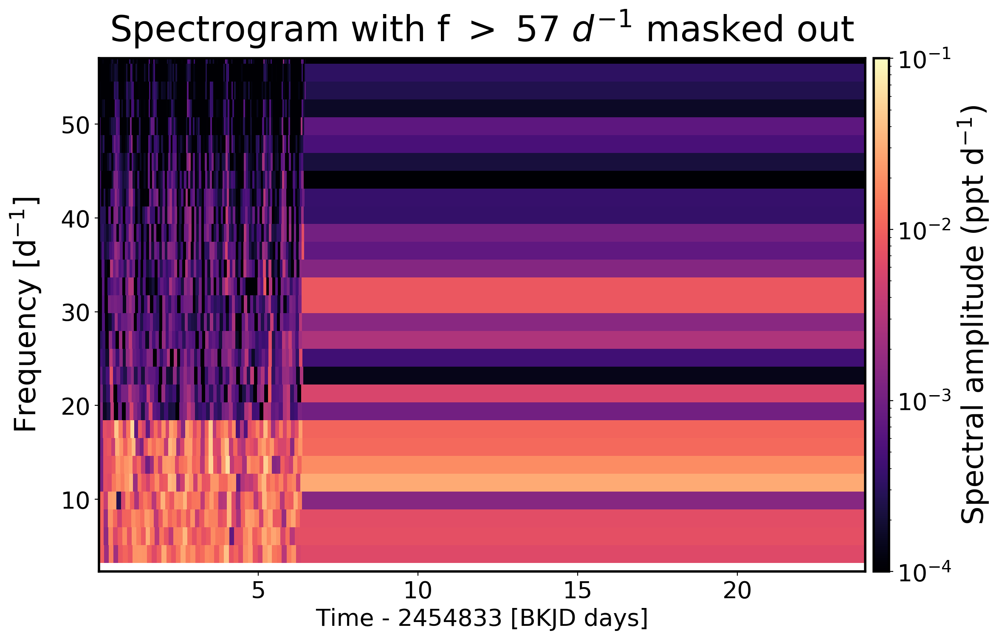

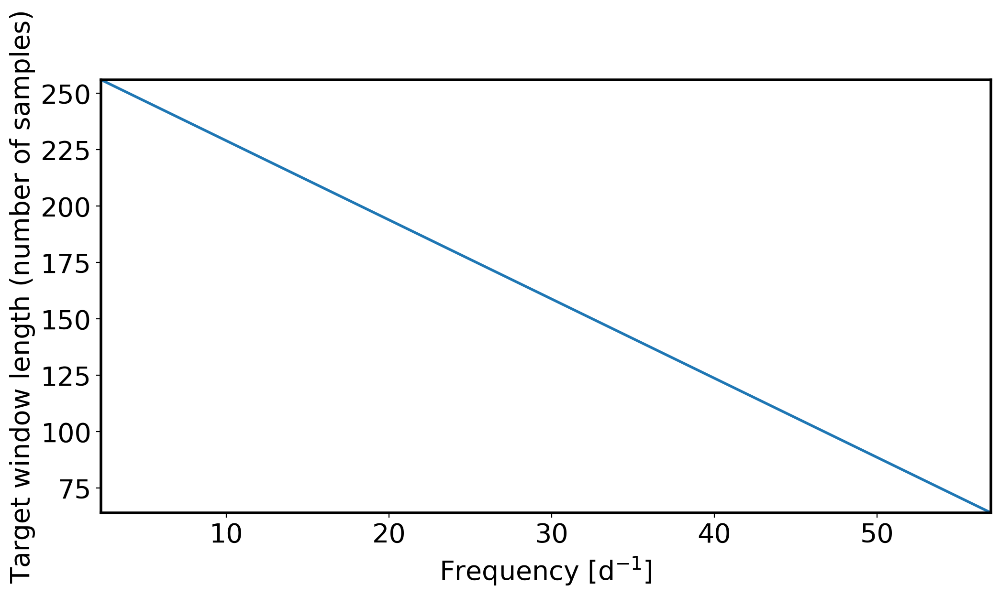

In [46]:
def plot_window_length_function(f_lims, n_intervals_lims, n_intervals_func):
    # Sample the window-length function.
    f_span = np.linspace(f_lims[0], f_lims[1], num = 100)
    nsamples_func_span = nsamples_func(f_span)

    fig, ax = plt.subplots(1,1, figsize=(12, 6))
    ax.plot(f_span, nsamples_func_span)
    ax.set_xlabel(r'Frequency [d$^{-1}$]', labelpad=5, fontsize=20)
    ax.set_ylabel('Target window length (number of samples)', fontsize=20)
    ax.set_xlim(f_lims)
    ax.set_ylim(n_intervals_lims)
    

def plot_spectrogram(t_corners, f_corners, spectrogram_grid):
    # Find the colour-bar limits (nearest powers of 10 which encompass data).
    abs_spectrogram_grid = np.abs(spectrogram_grid)
    min_abs_spectrogram_grid = np.min(abs_spectrogram_grid)
    min_c = 10.0**(np.floor(np.log10(min_abs_spectrogram_grid)))
    max_abs_spectrogram_grid = np.max(abs_spectrogram_grid)
    max_c = 10.0**(np.ceil(np.log10(max_abs_spectrogram_grid)))
    min_c = 1.0E-3*max_c
    c_norm = colors.LogNorm(vmin = min_c, vmax = max_c) # Use a logarithmic colour-bar normalisation.
    
    #Plot the Spectrogram
    fig = plt.figure(figsize = (12, 8))
    ax  = plt.gca()
    image = ax.pcolormesh(t_corners, f_corners, np.abs(spectrogram_grid), cmap="magma", norm=c_norm) #10*np.log10(np.abs(spectrogram_grid)**2)
    ax.set_xlabel("Time - %i [BKJD days]"%kepler_tref, fontsize=20)
    ax.set_ylabel(r'Frequency [d$^{-1}$]', labelpad=15)
    ax.set_ylim(min(freq_grid),f_max)
    ax.set_title(r"Spectrogram with f $>$ %i $d^{-1}$ masked out" %f_max,  y=1.02);
    
    # Add the colour bar.
    divider = make_axes_locatable(ax)
    c_ax = divider.append_axes('right', size = '2%', pad = 0.1)
    c_bar = fig.colorbar(image, cax = c_ax, orientation = 'vertical') 
    c_bar.ax.set_ylabel('Spectral amplitude (ppt d$^{-1})$') 

plot_spectrogram(t_grid, f_grid, spectrogram_grid)
plot_window_length_function([f_min, f_max], [nsamples_window_min, nsamples_window_max], nsamples_func)

## Plot Spectrogram Results
<a class="anchor" id="section_2_4"></a>

In [28]:
tperiastron = pd.read_csv("KIC%s/%s/data/t_periastron.txt" %(KIC, segment), header=0).values[0][0]
t0_secondary = pd.read_csv("KIC%s/%s/data/t0_secondary.txt" %(KIC, segment), header=0).values[0][0]

def calculate_n_integer(t, t_ref, P):
    min_n = int((min(t)-t_ref)/P)
    max_n = int((max(t)-t_ref)/P)+1
    n = np.arange(min_n, max_n, 1)
    return n

n_periastron = calculate_n_integer(time, tperiastron, lit_period)
n_peclipses = calculate_n_integer(time, lit_t0, lit_period)
n_seclipses = calculate_n_integer(time, t0_secondary, lit_period)

periastron_passages = tperiastron + n_periastron*lit_period
primary_passages = lit_t0+n_peclipses*lit_period
secondary_passages = t0_secondary+n_seclipses*lit_period

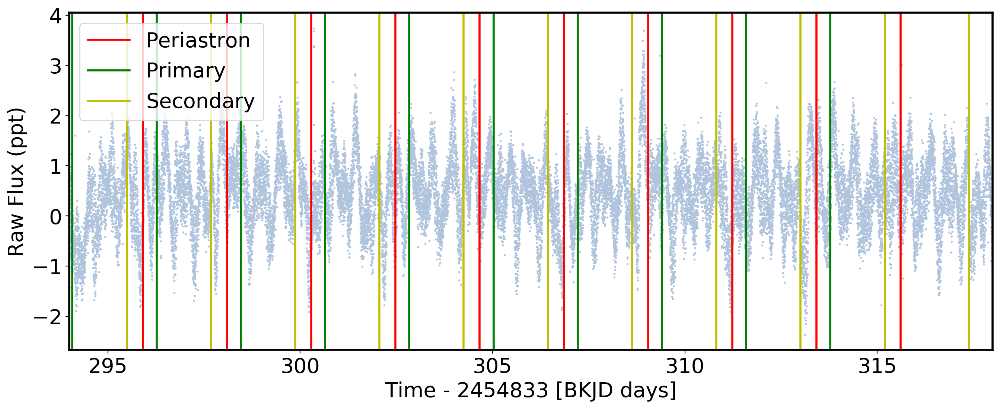

In [29]:
fig, ax = plt.subplots(1,1, figsize=(16,6))
ax.scatter(time, flux, c="lightsteelblue", s=1)
for i,(peri, prim, sec) in enumerate(zip(periastron_passages, primary_passages, secondary_passages)):
    if i==0:
        label1 = "Periastron"
        label2 = "Primary"
        label3 = "Secondary"
    else:
        label1, label2, label3 = None, None, None
    ax.axvline(peri, lw=2, c="r", label=label1)
    ax.axvline(prim, lw=2, c="g", label=label2)
    ax.axvline(sec, lw=2, c="y", label=label3)
ax.legend(fontsize=20)    
ax.set_xlabel("Time - %i [BKJD days]"%kepler_tref, fontsize=20)
ax.set_ylabel("Raw Flux (ppt)", fontsize=20);
ax.set_xlim(min(time), max(time)) ;

## Wavelet Analysis

<a href="https://www.kaggle.com/asauve/a-gentle-introduction-to-wavelet-for-data-analysis">[Source of Text below]</a> In the wavelet formalism, a scaleogram is a 2D representation of 1D data with

* On the X axis the time

* On the Y axis the scale

The scale correspond to the signal periodicity to which the transform is sentitive to. The value correspond to the amplitude of the signal variation measured. These variations are located at time X and have a periodicity Y. This kind of plot is a special kind of spectrogram, but in the case of wavelet the resolution in time vary with the scale value on the Y axis.

In [30]:
import pywt
import scaleogram as scg

Choose default wavelet function

(<matplotlib.axes._subplots.AxesSubplot at 0x7ff52ca8edd0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7ff52ca7fcd0>)

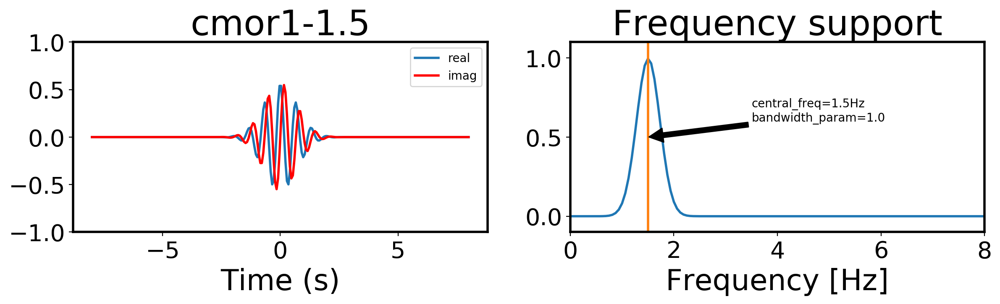

In [31]:
wavelet = 'cmor1-1.5'
scg.set_default_wavelet(wavelet)
scg.plot_wav(wavelet, figsize=(14,3))

# Try these ones to see various compromises between scales and time resolution 
#scg.set_default_wavelet('cgau5')
#scg.set_default_wavelet('cgau1')
#scg.set_default_wavelet('shan0.5-2')
#scg.set_default_wavelet('mexh')

Range of scales to perform the transform

In [32]:
#scales = scg.periods2scales(np.arange(minfr, fmax, 0.1))

scales = scg.periods2scales(np.logspace(np.log10(minfr), np.log10(fmax), 200)) #use logaritmic spaced scales values when using log-Y-axis
len(scales)

200

Perform mean removal. This is is mandatory, otherwise the borders of the data are considered as steps which create a lot of spurious cone shaped detection.

In [33]:
flux_osc_norm = flux_osc-flux_osc.mean()

Default wavelet function used to compute the transform: cmor1-1.5 ( Complex Morlet wavelets )


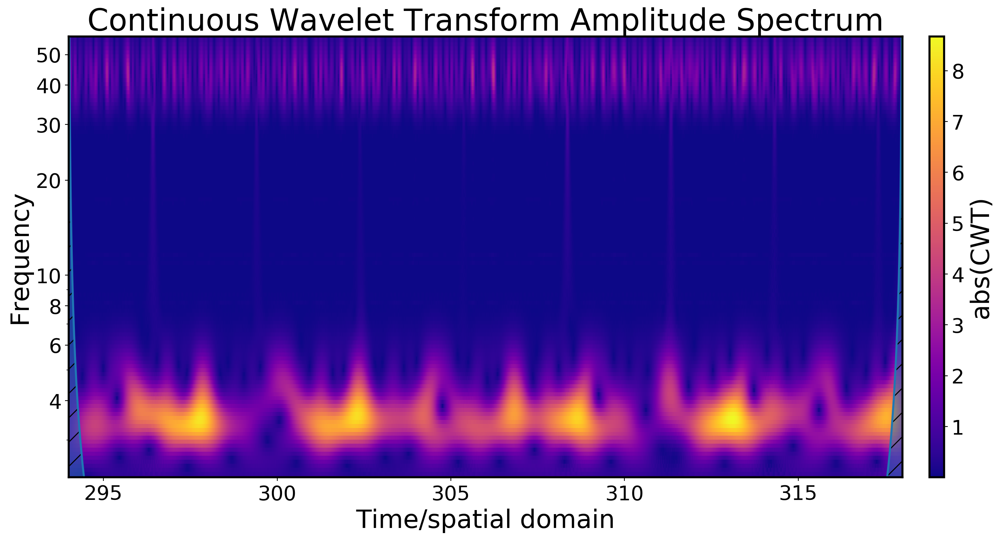

In [34]:
#Plot scaleogram
fig, ax = plt.subplots(1,1,figsize=(16,8))
ax = scg.cws(time_osc, 
             signal  = flux_osc_norm,
             scales  = scales,
             yaxis   = "frequency",
             wavelet = wavelet, 
             ax      = ax, 
             cmap    = "plasma",
             yscale  = "log",
             #clim    = (0,7))
            )

ax.set_yticks([2, 4, 6, 8, 10, 20, 30, 40, 50, 60])
ax.set_ylim([f_min, f_max])
ax.get_yaxis().set_major_formatter(ScalarFormatter())
print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(",
      pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")

In [35]:
97*orbital_frequency, osc_data

(44.3105079400319,
          freq     power      f_forb  d_to_int    Pgp_Posc_1  Pgp_Posc_2
 0    3.470059  0.034315    7.596297  0.403703      0.000059    0.000054
 1   48.014898  0.014950  105.109284  0.109284      0.000052    0.000047
 2   41.369640  0.014533   90.562168  0.437832      0.000072    0.000066
 3   44.848803  0.007648   98.178393  0.178393      0.001268    0.000106
 4   46.202681  0.004903  101.142164  0.142164      0.001017    0.001031
 5    2.560648  0.003891    5.605508  0.394492      0.002475    0.002120
 6   39.541967  0.003320   86.561212  0.438788      0.000191    0.000207
 7    2.925633  0.003020    6.404496  0.404496      0.007744    0.010332
 8   43.449846  0.002707   95.115940  0.115940      0.001514    0.001380
 9   47.100858  0.002598  103.108361  0.108361      0.004482    0.002990
 10   3.914625  0.002565    8.569494  0.430506      0.038590    0.042087
 11   4.838821  0.002488   10.592650  0.407350      0.005317    0.007919
 12  40.455900  0.002265   88.56

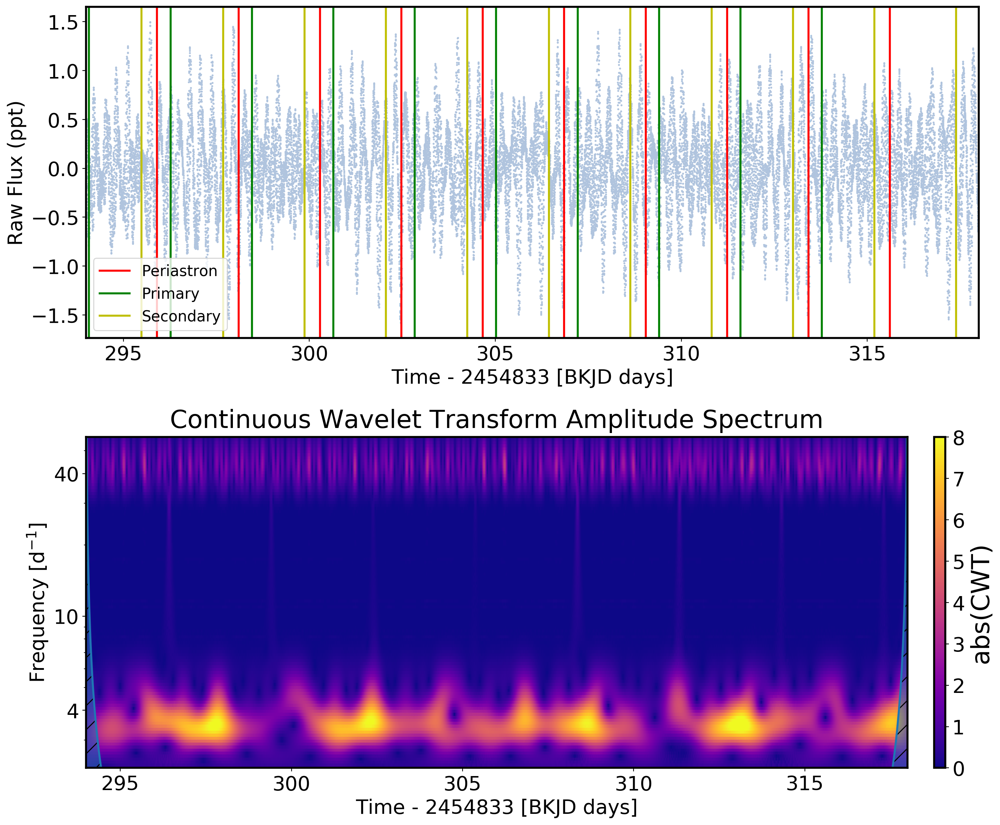

In [36]:
fig, ax = plt.subplots(2,1, figsize=(16,14))
fig.subplots_adjust(hspace=0.3)
ax[0].scatter(time_osc, flux_osc, s=1, c="lightsteelblue")
for i,(peri, prim, sec) in enumerate(zip(periastron_passages, primary_passages, secondary_passages)):
    if i==0:
        label1 = "Periastron"
        label2 = "Primary"
        label3 = "Secondary"
    else:
        label1, label2, label3 = None, None, None
    ax[0].axvline(peri, lw=2, c="r", label=label1)
    ax[0].axvline(prim, lw=2, c="g", label=label2)
    ax[0].axvline(sec, lw=2, c="y", label=label3)
ax[0].legend(fontsize=15)    
ax[0].set_ylabel("Raw Flux (ppt)", fontsize=20);
ax[0].set_xlabel("Time - %i [BKJD days]"%kepler_tref, fontsize=20)

ax[1] = scg.cws(time_osc, 
             signal  = flux_osc_norm,
             scales  = scales,
             yaxis   = "frequency",
             wavelet = wavelet, 
             ax      = ax[1], 
             cmap    = "plasma",
             yscale  = "log",
             clim    = (0, 8))

ax[1].set_yticks([2, 4, 10, 40])
ax[1].set_ylim([f_min, f_max])
ax[1].get_yaxis().set_major_formatter(ScalarFormatter())
ax[1].set_xlabel("Time - %i [BKJD days]"%kepler_tref, fontsize=20)
ax[1].set_ylabel(r"Frequency [d$^{-1}$]", fontsize=20)
ax[1].set_title("Continuous Wavelet Transform Amplitude Spectrum", fontsize=25, y=1.01)

xmin, xmax = min(time_osc), max(time_osc)
ax[0].set_xlim(xmin, xmax);
ax[1].set_xlim(xmin, xmax);

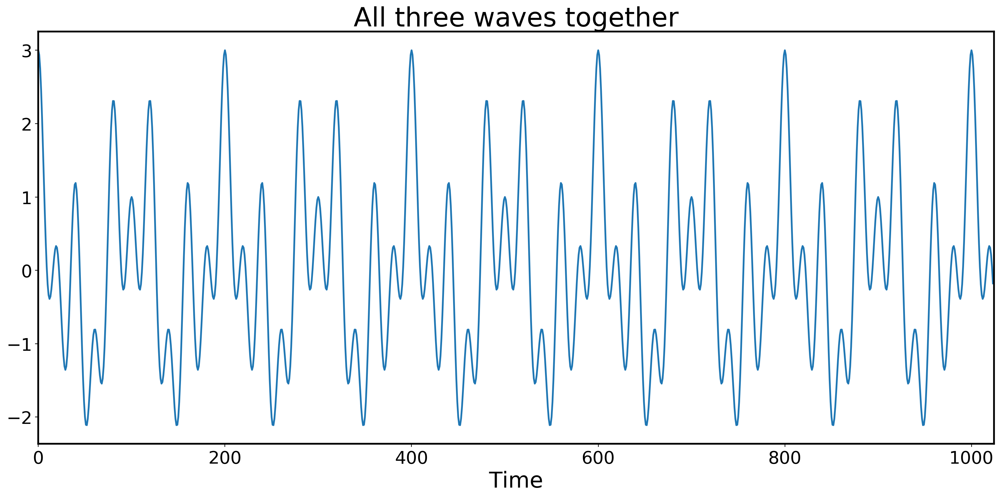

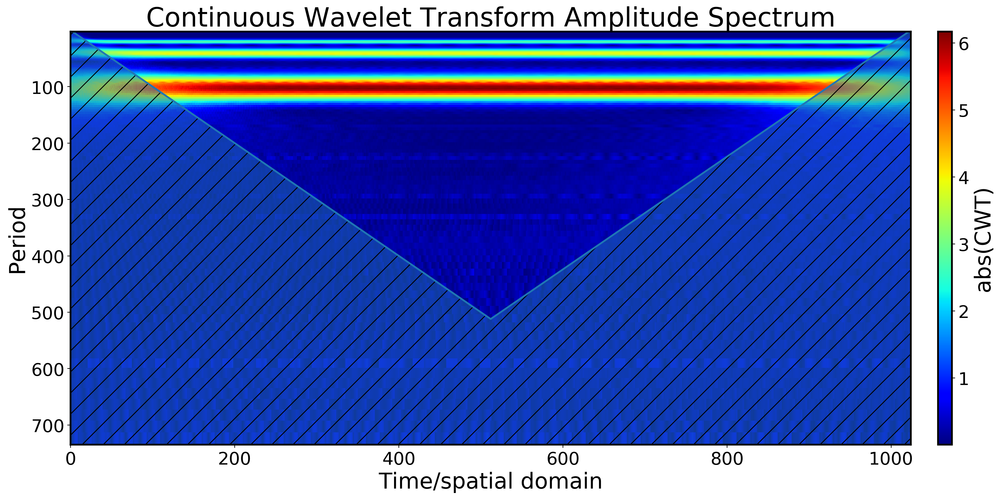

In [37]:
# generate a signal with the three waves together
ns   = 1024
ttime = np.arange(ns)
periods = [20, 40, 100]
allwaves = np.zeros(ns, dtype=np.float32)
for i in range(0,3):
    allwaves += np.cos(2*np.pi/periods[i]*ttime)

# plot the waves
fig1, ax1 = plt.subplots(1, 1, figsize=(16,8));  
lines = ax1.plot(allwaves); ax1.set_title("All three waves together") 
ax1.set_xlim(0, len(ttime)); ax1.set_xlabel("Time")
fig1.tight_layout()

# and the scaleogram
ax2 = scg.cws(allwaves, scales=scales, figsize=(16,8))
plt.tight_layout()

In [38]:
def plot_wavelet(t, signal, scales, sampling_interval, 
                 passages=False,
                 freq_lims = None,
                 waveletname = 'cmor1.5-1.0', 
                 color_map = color_map):
    
    
    #Source: http://ataspinar.com/2018/12/21/a-guide-for-using-the-wavelet-transform-in-machine-learning/
    [coefficients, frequencies] = pywt.cwt(signal, scales, waveletname, sampling_interval)
    
    power = (abs(coefficients)) ** 2
    period = 1. / frequencies
    normalized_power = power/max(osc_data["power"])
    max_normP_db = int(np.max(10*np.log10(normalized_power)))
    levels = np.arange(0.001, max_normP_db, 1, dtype=float) #[0.001, 0.01, 0.1, 1.0, 2.0, 4.0, 8.0, 12.0, 16.0, 18.0, 20.0, 22.0, 24.0, 26.0, max_normP_db]
    
    fig, ax = plt.subplots(1,1, figsize=(16.5, 8))
    im = ax.contourf(t, frequencies, 10*np.log10(normalized_power), levels, extend='both', cmap=color_map, vmin=pmin)
    #im = ax.contourf(time, np.log2(frequencies), np.log2(normalized_power), np.log2(levels), extend='both', cmap=color_map, vmin=pmin)
    
    ax.set_title('Wavelet Transform (Power Spectrum) of Signal (%s)' %waveletname, fontsize=25, y=1.02)
    ax.set_xlim(min(t), max(t))
    ax.set_ylabel(r"Frequency [$d^{-1}$]", fontsize=20)
    ax.set_xlabel("Time [BKJD days]", fontsize=20)
    
    if freq_lims is not None: 
        ax.set_ylim(freq_lims)
        fmin_fig = freq_lims[0]
        fmax_fig = freq_lims[1]
    else:
        ax.set_ylim(f_min, f_max)#fmax_spec)
        fmin_fig, fmax_fig = f_min, f_max
        
    
    cbar_ax = fig.add_axes([0.92, 0.2, 0.03, 0.6])
    fig.colorbar(im, cax=cbar_ax, orientation="vertical", label = "Power [dB]")
    
    if passages:
        for i,(peri, prim, sec) in enumerate(zip(periastron_passages, primary_passages, secondary_passages)):
            if i==0:
                label1 = "Periastron"
                label2 = "Primary"
                label3 = "Secondary"
            else:
                label1, label2, label3 = None, None, None
            ax.axvline(peri, lw=3, ls=":", c="green", label=label1)
            ax.axvline(prim, lw=2, ls="-", c="dodgerblue", label=label2)
            ax.axvline(sec, lw=2, ls="-", c="yellow", label=label3)
        ax.legend(fontsize=18)
    
        #plt.savefig(dir_fig+"wavelet_%ito%i_%s_passages.png"% (fmin_fig, fmax_fig,waveletname), dpi=300)
        
    #else:
    #    plt.savefig(dir_fig+"wavelet_%ito%i_%s.png"% (fmin_fig, fmax_fig,waveletname), dpi=300)

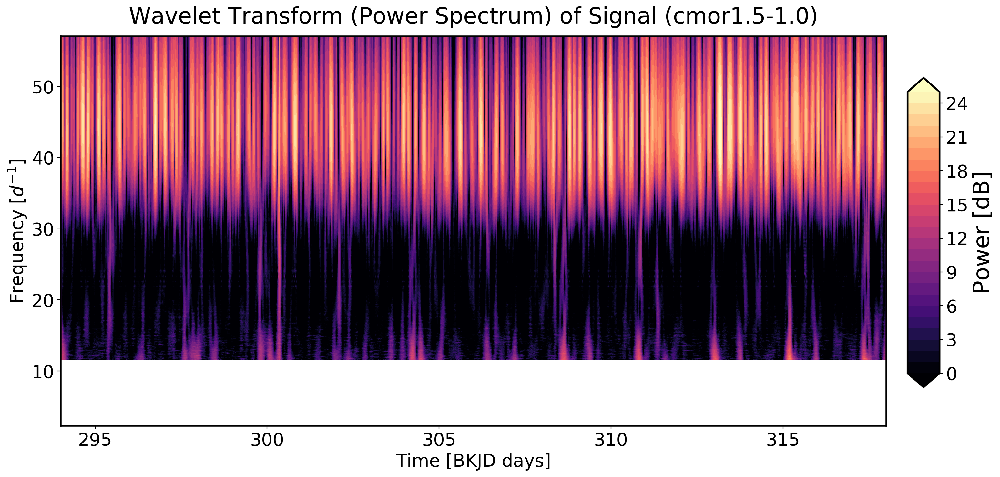

In [39]:
scales = np.arange(1, 128, 1)
plot_wavelet(time, flux, scales, dt, freq_lims=[f_min, f_max])